## Trigger Word Detection

Welcome to the final programming assignment of this specialization! 

In this week's videos, you learned about applying deep learning to speech recognition. In this assignment, you will construct a speech dataset and implement an algorithm for trigger word detection (sometimes also called keyword detection, or wakeword detection). Trigger word detection is the technology that allows devices like Amazon Alexa, Google Home, Apple Siri, and Baidu DuerOS to wake up upon hearing a certain word.  

For this exercise, our trigger word will be "Activate." Every time it hears you say "activate," it will make a "chiming" sound. By the end of this assignment, you will be able to record a clip of yourself talking, and have the algorithm trigger a chime when it detects you saying "activate." 

After completing this assignment, perhaps you can also extend it to run on your laptop so that every time you say "activate" it starts up your favorite app, or turns on a network connected lamp in your house, or triggers some other event? 

<img src="images/sound.png" style="width:1000px;height:150px;">

In this assignment you will learn to: 
- Structure a speech recognition project
- Synthesize and process audio recordings to create train/dev datasets
- Train a trigger word detection model and make predictions

Lets get started! Run the following cell to load the package you are going to use.    


In [1]:
import numpy as np
import pandas as pd
from pydub import AudioSegment,silence
from pydub.generators import WhiteNoise
from pydub.playback import play
import subprocess
import random
import sys
import io
import csv
import os
import glob
import IPython

import IPython.display as ip
from IPython.display import HTML
from td_utils import *
from mpl_toolkits import mplot3d
import math
%matplotlib inline

C:\Users\Prathyusha\AppData\Local\Programs\Python\Python36\lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


# 1 - Data synthesis: Creating a speech dataset 

Let's start by building a dataset for your trigger word detection algorithm. A speech dataset should ideally be as close as possible to the application you will want to run it on. In this case, you'd like to detect the word "activate" in working environments (library, home, offices, open-spaces ...). You thus need to create recordings with a mix of positive words ("activate") and negative words (random words other than activate) on different background sounds. Let's see how you can create such a dataset. 

## 1.1 - Listening to the data   

One of your friends is helping you out on this project, and they've gone to libraries, cafes, restaurants, homes and offices all around the region to record background noises, as well as snippets of audio of people saying positive/negative words. This dataset includes people speaking in a variety of accents. 

In the raw_data directory, you can find a subset of the raw audio files of the positive words, negative words, and background noise. You will use these audio files to synthesize a dataset to train the model. The "activate" directory contains positive examples of people saying the word "activate". The "negatives" directory contains negative examples of people saying random words other than "activate". There is one word per audio recording. The "backgrounds" directory contains 10 second clips of background noise in different environments.

Run the cells below to listen to some examples.

In [3]:
IPython.display.Audio("./raw_data/activates/1.wav")

ValueError: rate must be specified when data is a numpy array or list of audio samples.

In [ ]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [ ]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

You will use these three type of recordings (positives/negatives/backgrounds) to create a labelled dataset.

## 1.2 - From audio recordings to spectrograms

What really is an audio recording? A microphone records little variations in air pressure over time, and it is these little variations in air pressure that your ear also perceives as sound. You can think of an audio recording is a long list of numbers measuring the little air pressure changes detected by the microphone. We will use audio sampled at 44100 Hz (or 44100 Hertz). This means the microphone gives us 44100 numbers per second. Thus, a 10 second audio clip is represented by 441000 numbers (= $10 \times 44100$). 

It is quite difficult to figure out from this "raw" representation of audio whether the word "activate" was said. In  order to help your sequence model more easily learn to detect triggerwords, we will compute a *spectrogram* of the audio. The spectrogram tells us how much different frequencies are present in an audio clip at a moment in time. 

(If you've ever taken an advanced class on signal processing or on Fourier transforms, a spectrogram is computed by sliding a window over the raw audio signal, and calculates the most active frequencies in each window using a Fourier transform. If you don't understand the previous sentence, don't worry about it.) 

Lets see an example. 

In [4]:
IPython.display.Audio("audio_examples/example_train.wav")

C:\Users\Prathyusha\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


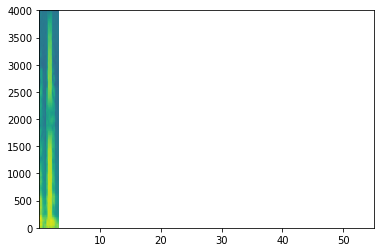

In [3]:
x = graph_spectrogram("./combined1.wav")

The graph above represents how active each frequency is (y axis) over a number of time-steps (x axis). 

<img src="images/spectrogram.png" style="width:500px;height:200px;">
<center> **Figure 1**: Spectrogram of an audio recording, where the color shows the degree to which different frequencies are present (loud) in the audio at different points in time. Green squares means a certain frequency is more active or more present in the audio clip (louder); blue squares denote less active frequencies. </center>

The dimension of the output spectrogram depends upon the hyperparameters of the spectrogram software and the length of the input. In this notebook, we will be working with 10 second audio clips as the "standard length" for our training examples. The number of timesteps of the spectrogram will be 5511. You'll see later that the spectrogram will be the input $x$ into the network, and so $T_x = 5511$.


In [4]:
_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


Now, you can define:

In [5]:
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

Note that even with 10 seconds being our default training example length, 10 seconds of time can be discretized to different numbers of value. You've seen 441000 (raw audio) and 5511 (spectrogram). In the former case, each step represents $10/441000 \approx 0.000023$ seconds. In the second case, each step represents $10/5511 \approx 0.0018$ seconds. 

For the 10sec of audio, the key values you will see in this assignment are:

- $441000$ (raw audio)
- $5511 = T_x$ (spectrogram output, and dimension of input to the neural network). 
- $10000$ (used by the `pydub` module to synthesize audio) 
- $1375 = T_y$ (the number of steps in the output of the GRU you'll build). 

Note that each of these representations correspond to exactly 10 seconds of time. It's just that they are discretizing them to different degrees. All of these are hyperparameters and can be changed (except the 441000, which is a function of the microphone). We have chosen values that are within the standard ranges uses for speech systems. 

Consider the $T_y = 1375$ number above. This means that for the output of the model, we discretize the 10s into 1375 time-intervals (each one of length $10/1375 \approx 0.0072$s) and try to predict for each of these intervals whether someone recently finished saying "activate." 

Consider also the 10000 number above. This corresponds to discretizing the 10sec clip into 10/10000 = 0.001 second itervals. 0.001 seconds is also called 1 millisecond, or 1ms. So when we say we are discretizing according to 1ms intervals, it means we are using 10,000 steps. 


In [6]:
Ty = 1375 # The number of time steps in the output of our model

## 1.3 - Generating a single training example

Because speech data is hard to acquire and label, you will synthesize your training data using the audio clips of activates, negatives, and backgrounds. It is quite slow to record lots of 10 second audio clips with random "activates" in it. Instead, it is easier to record lots of positives and negative words, and record background noise separately (or download background noise from free online sources). 

To synthesize a single training example, you will:

- Pick a random 10 second background audio clip
- Randomly insert 0-4 audio clips of "activate" into this 10sec clip
- Randomly insert 0-2 audio clips of negative words into this 10sec clip

Because you had synthesized the word "activate" into the background clip, you know exactly when in the 10sec clip the "activate" makes its appearance. You'll see later that this makes it easier to generate the labels $y^{\langle t \rangle}$ as well. 

You will use the pydub package to manipulate audio. Pydub converts raw audio files into lists of Pydub data structures (it is not important to know the details here). Pydub uses 1ms as the discretization interval (1ms is 1 millisecond = 1/1000 seconds) which is why a 10sec clip is always represented using 10,000 steps. 

In [7]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio()

print("background len: " + str(len(backgrounds[0])))    # Should be 10,000, since it is a 10 sec clip
print("activate[0] len: " + str(len(activates[0])))     # Maybe around 1000, since an "activate" audio clip is usually around 1 sec (but varies a lot)
print("activate[1] len: " + str(len(activates[1])))     # Different "activate" clips can have different lengths 

background len: 10000
activate[0] len: 631
activate[1] len: 1581


**Overlaying positive/negative words on the background**:

Given a 10sec background clip and a short audio clip (positive or negative word), you need to be able to "add" or "insert" the word's short audio clip onto the background. To ensure audio segments inserted onto the background do not overlap, you will keep track of the times of previously inserted audio clips. You will be inserting multiple clips of positive/negative words onto the background, and you don't want to insert an "activate" or a random word somewhere that overlaps with another clip you had previously added. 

For clarity, when you insert a 1sec "activate" onto a 10sec clip of cafe noise, you end up with a 10sec clip that sounds like someone sayng "activate" in a cafe, with "activate" superimposed on the background cafe noise. You do *not* end up with an 11 sec clip. You'll see later how pydub allows you to do this. 

**Creating the labels at the same time you overlay**:

Recall also that the labels $y^{\langle t \rangle}$ represent whether or not someone has just finished saying "activate." Given a background clip, we can initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activates." 

When you insert or overlay an "activate" clip, you will also update labels for $y^{\langle t \rangle}$, so that 50 steps of the output now have target label 1. You will train a GRU to detect when someone has *finished* saying "activate". For example, suppose the synthesized "activate" clip ends at the 5sec mark in the 10sec audio---exactly halfway into the clip. Recall that $T_y = 1375$, so timestep $687 = $ `int(1375*0.5)` corresponds to the moment at 5sec into the audio. So, you will set $y^{\langle 688 \rangle} = 1$. Further, you would quite satisfied if the GRU detects "activate" anywhere within a short time-internal after this moment, so we actually set 50 consecutive values of the label $y^{\langle t \rangle}$ to 1. Specifically, we have $y^{\langle 688 \rangle} = y^{\langle 689 \rangle} = \cdots = y^{\langle 737 \rangle} = 1$.  

This is another reason for synthesizing the training data: It's relatively straightforward to generate these labels $y^{\langle t \rangle}$ as described above. In contrast, if you have 10sec of audio recorded on a microphone, it's quite time consuming for a person to listen to it and mark manually exactly when "activate" finished. 

Here's a figure illustrating the labels $y^{\langle t \rangle}$, for a clip which we have inserted "activate", "innocent", activate", "baby." Note that the positive labels "1" are associated only with the positive words. 

<img src="images/label_diagram.png" style="width:500px;height:200px;">
<center> **Figure 2** </center>

To implement the training set synthesis process, you will use the following helper functions. All of these function will use a 1ms discretization interval, so the 10sec of audio is alwsys discretized into 10,000 steps. 

1. `get_random_time_segment(segment_ms)` gets a random time segment in our background audio
2. `is_overlapping(segment_time, existing_segments)` checks if a time segment overlaps with existing segments
3. `insert_audio_clip(background, audio_clip, existing_times)` inserts an audio segment at a random time in our background audio using `get_random_time_segment` and `is_overlapping`
4. `insert_ones(y, segment_end_ms)` inserts 1's into our label vector y after the word "activate"

The function `get_random_time_segment(segment_ms)` returns a random time segment onto which we can insert an audio clip of duration `segment_ms`. Read through the code to make sure you understand what it is doing. 


In [8]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

Next, suppose you have inserted audio clips at segments (1000,1800) and (3400,4500). I.e., the first segment starts at step 1000, and ends at step 1800. Now, if we are considering inserting a new audio clip at (3000,3600) does this overlap with one of the previously inserted segments? In this case, (3000,3600) and (3400,4500) overlap, so we should decide against inserting a clip here. 

For the purpose of this function, define (100,200) and (200,250) to be overlapping, since they overlap at timestep 200. However, (100,199) and (200,250) are non-overlapping. 

**Exercise**: Implement `is_overlapping(segment_time, existing_segments)` to check if a new time segment overlaps with any of the previous segments. You will need to carry out 2 steps:

1. Create a "False" flag, that you will later set to "True" if you find that there is an overlap.
2. Loop over the previous_segments' start and end times. Compare these times to the segment's start and end times. If there is an overlap, set the flag defined in (1) as True. You can use:
```python
for ....:
        if ... <= ... and ... >= ...:
            ...
```
Hint: There is overlap if the segment starts before the previous segment ends, and the segment ends after the previous segment starts.

In [9]:
# GRADED FUNCTION: is_overlapping

def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    ### START CODE HERE ### (≈ 4 line)
    # Step 1: Initialize overlap as a "False" flag. (≈ 1 line)
    overlap = False
    
    # Step 2: loop over the previous_segments start and end times.
    # Compare start/end times and set the flag to True if there is an overlap (≈ 3 lines)
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True
    ### END CODE HERE ###

    return overlap

In [10]:
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2304), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  False


**Expected Output**:

<table>
    <tr>
        <td>
            **Overlap 1**
        </td>
        <td>
           False
        </td>
    </tr>
    <tr>
        <td>
            **Overlap 2**
        </td>
        <td>
           True
        </td>
    </tr>
</table>

Now, lets use the previous helper functions to insert a new audio clip onto the 10sec background at a random time, but making sure that any newly inserted segment doesn't overlap with the previous segments. 

**Exercise**: Implement `insert_audio_clip()` to overlay an audio clip onto the background 10sec clip. You will need to carry out 4 steps:

1. Get a random time segment of the right duration in ms.
2. Make sure that the time segment does not overlap with any of the previous time segments. If it is overlapping, then go back to step 1 and pick a new time segment.
3. Add the new time segment to the list of existing time segments, so as to keep track of all the segments you've inserted.  
4. Overlay the audio clip over the background using pydub. We have implemented this for you.

In [13]:
# GRADED FUNCTION: insert_audio_clip

def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
    
    ### START CODE HERE ### 
    # Step 1: Use one of the helper functions to pick a random time segment onto which to insert 
    # the new audio clip. (≈ 1 line)
    segment_time = get_random_time_segment(segment_ms)
    
    # Step 2: Check if the new segment_time overlaps with one of the previous_segments. If so, keep 
    # picking new segment_time at random until it doesn't overlap. (≈ 2 lines)
    while is_overlapping(segment_time, previous_segments):
        segment_time = get_random_time_segment(segment_ms)

    # Step 3: Add the new segment_time to the list of previous_segments (≈ 1 line)
    previous_segments.append(segment_time)
    ### END CODE HERE ###
    
    # Step 4: Superpose audio segment and background
    new_background = background.overlay(audio_clip, position = segment_time[0])
    
    return new_background, segment_time

In [14]:
np.random.seed(5)
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (2915, 3545)


**Expected Output**

<table>
    <tr>
        <td>
            **Segment Time**
        </td>
        <td>
           (2254, 3169)
        </td>
    </tr>
</table>

In [15]:
# Expected audio
IPython.display.Audio("audio_examples/insert_reference.wav")

Finally, implement code to update the labels $y^{\langle t \rangle}$, assuming you just inserted an "activate." In the code below, `y` is a `(1,1375)` dimensional vector, since $T_y = 1375$. 

If the "activate" ended at time step $t$, then set $y^{\langle t+1 \rangle} = 1$ as well as for up to 49 additional consecutive values. However, make sure you don't run off the end of the array and try to update `y[0][1375]`, since the valid indices are `y[0][0]` through `y[0][1374]` because $T_y = 1375$. So if "activate" ends at step 1370, you would get only `y[0][1371] = y[0][1372] = y[0][1373] = y[0][1374] = 1`

**Exercise**: Implement `insert_ones()`. You can use a for loop. (If you are an expert in python's slice operations, feel free also to use slicing to vectorize this.) If a segment ends at `segment_end_ms` (using a 10000 step discretization), to convert it to the indexing for the outputs $y$ (using a $1375$ step discretization), we will use this formula:  
```
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
```

In [16]:
# GRADED FUNCTION: insert_ones

def insert_ones(y, segment_end_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 followinf labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    # Add 1 to the correct index in the background label (y)
    ### START CODE HERE ### (≈ 3 lines)
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[0, i] = 1
    ### END CODE HERE ###
    
    return y

sanity checks: 0.0 1.0 0.0


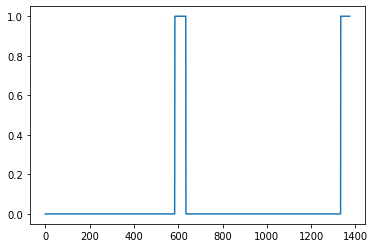

In [17]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])

**Expected Output**
<table>
    <tr>
        <td>
            **sanity checks**:
        </td>
        <td>
           0.0 1.0 0.0
        </td>
    </tr>
</table>
<img src="images/ones_reference.png" style="width:320;height:240px;">

Finally, you can use `insert_audio_clip` and `insert_ones` to create a new training example.

**Exercise**: Implement `create_training_example()`. You will need to carry out the following steps:

1. Initialize the label vector $y$ as a numpy array of zeros and shape $(1, T_y)$.
2. Initialize the set of existing segments to an empty list.
3. Randomly select 0 to 4 "activate" audio clips, and insert them onto the 10sec clip. Also insert labels at the correct position in the label vector $y$.
4. Randomly select 0 to 2 negative audio clips, and insert them into the 10sec clip. 


In [18]:
# GRADED FUNCTION: create_training_example

def create_training_example(background, activates, negatives):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a 10 second background audio recording
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    # Set the random seed
    np.random.seed(18)
    
    # Make background quieter
    background = background - 20

    ### START CODE HERE ###
    # Step 1: Initialize y (label vector) of zeros (≈ 1 line)
    y = np.zeros((1, Ty))

    # Step 2: Initialize segment times as empty list (≈ 1 line)
    previous_segments = []
    ### END CODE HERE ###
    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    ### START CODE HERE ### (≈ 3 lines)
    # Step 3: Loop over randomly selected "activate" clips and insert in background
    for random_activate in random_activates:
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Insert labels in "y"
        y = insert_ones(y, segment_end_ms=segment_end)
    ### END CODE HERE ###

    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    ### START CODE HERE ### (≈ 2 lines)
    # Step 4: Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        # Insert the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    ### END CODE HERE ###
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    
    return x, y

File (train.wav) was saved in your directory.


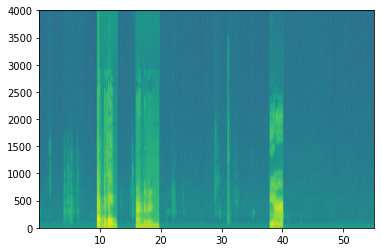

In [19]:
x, y = create_training_example(backgrounds[0], activates, negatives)

In [20]:
y.shape

(1, 1375)

**Expected Output**
<img src="images/train_reference.png" style="width:320;height:240px;">

Now you can listen to the training example you created and compare it to the spectrogram generated above.

In [21]:
IPython.display.Audio("train.wav")

**Expected Output**

In [22]:
IPython.display.Audio("audio_examples/train_reference.wav")

Finally, you can plot the associated labels for the generated training example.

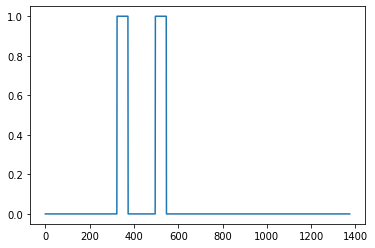

In [23]:
plt.plot(y[0])

**Expected Output**
<img src="images/train_label.png" style="width:320;height:240px;">

## 1.4 - Full training set

You've now implemented the code needed to generate a single training example. We used this process to generate a large training set. To save time, we've already generated a set of training examples. 

In [24]:
# Load preprocessed training examples
Z = np.load("./XY_train/X.npy")
Y = np.load("./XY_train/Y.npy")

Z=np.asarray(Z)
Y=np.asarray(Y)

for yi in Y:
    print(yi)

[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]

In [25]:
Z.shape

(26, 5511, 101)

In [26]:
Y.shape

(26, 1375, 1)

## 1.5 - Development set

To test our model, we recorded a development set of 25 examples. While our training data is synthesized, we want to create a development set using the same distribution as the real inputs. Thus, we recorded 25 10-second audio clips of people saying "activate" and other random words, and labeled them by hand. This follows the principle described in Course 3 that we should create the dev set to be as similar as possible to the test set distribution; that's why our dev set uses real rather than synthesized audio. 


In [27]:
# Load preprocessed dev set examples
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

In [28]:
Y_dev.shape

(25, 1375, 1)

# 2 - Model

Now that you've built a dataset, lets write and train a trigger word detection model! 

The model will use 1-D convolutional layers, GRU layers, and dense layers. Let's load the packages that will allow you to use these layers in Keras. This might take a minute to load. 

In [11]:
from tensorflow import keras
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
#from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
print(tf.test.gpu_device_name())

/device:GPU:0


## 2.1 - Build the model

Here is the architecture we will use. Take some time to look over the model and see if it makes sense. 

<img src="images/model_trigger.png" style="width:600px;height:600px;">
<center> **Figure 3** </center>

One key step of this model is the 1D convolutional step (near the bottom of Figure 3). It inputs the 5511 step spectrogram, and outputs a 1375 step output, which is then further processed by multiple layers to get the final $T_y = 1375$ step output. This layer plays a role similar to the 2D convolutions you saw in Course 4, of extracting low-level features and then possibly generating an output of a smaller dimension. 

Computationally, the 1-D conv layer also helps speed up the model because now the GRU  has to process only 1375 timesteps rather than 5511 timesteps. The two GRU layers read the sequence of inputs from left to right, then ultimately uses a dense+sigmoid layer to make a prediction for $y^{\langle t \rangle}$. Because $y$ is binary valued (0 or 1), we use a sigmoid output at the last layer to estimate the chance of the output being 1, corresponding to the user having just said "activate."

Note that we use a uni-directional RNN rather than a bi-directional RNN. This is really important for trigger word detection, since we want to be able to detect the trigger word almost immediately after it is said. If we used a bi-directional RNN, we would have to wait for the whole 10sec of audio to be recorded before we could tell if "activate" was said in the first second of the audio clip.  


Implementing the model can be done in four steps:
    
**Step 1**: CONV layer. Use `Conv1D()` to implement this, with 196 filters, 
a filter size of 15 (`kernel_size=15`), and stride of 4. [[See documentation.](https://keras.io/layers/convolutional/#conv1d)]

**Step 2**: First GRU layer. To generate the GRU layer, use:
```
X = GRU(units = 128, return_sequences = True)(X)
```
Setting `return_sequences=True` ensures that all the GRU's hidden states are fed to the next layer. Remember to follow this with Dropout and BatchNorm layers. 

**Step 3**: Second GRU layer. This is similar to the previous GRU layer (remember to use `return_sequences=True`), but has an extra dropout layer. 

**Step 4**: Create a time-distributed dense layer as follows: 
```
X = TimeDistributed(Dense(1, activation = "sigmoid"))(X)
```
This creates a dense layer followed by a sigmoid, so that the parameters used for the dense layer are the same for every time step. [[See documentation](https://keras.io/layers/wrappers/).]

**Exercise**: Implement `model()`, the architecture is presented in Figure 3.

In [12]:
# GRADED FUNCTION: model

def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    ### START CODE HERE ###
    
    # Step 1: CONV layer (≈4 lines)
    X = Conv1D(196, kernel_size=15, strides=4)(X_input)                                 # CONV1D
    X = BatchNormalization()(X)                                 # Batch normalization
    X = Activation('relu')(X)                                 # ReLu activation
    X = Dropout(0.8)(X)                                 # dropout (use 0.8)

    # Step 2: First GRU Layer (≈4 lines)
    X = GRU(units = 128, return_sequences = True)(X) # GRU (use 128 units and return the sequences)
    X = Dropout(0.8)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                                 # Batch normalization
    
    # Step 3: Second GRU Layer (≈4 lines)
    X = GRU(units = 128, return_sequences = True)(X)   # GRU (use 128 units and return the sequences)
    X = Dropout(0.8)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                                  # Batch normalization
    X = Dropout(0.8)(X)                                  # dropout (use 0.8)
    
    # Step 4: Time-distributed dense layer (≈1 line)
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) # time distributed  (sigmoid)

    ### END CODE HERE ###

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [13]:
model = model(input_shape = (Tx, n_freq))

Let's print the model summary to keep track of the shapes.

In [14]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d (Conv1D)              (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization (BatchNo (None, 1375, 196)         784       
_________________________________________________________________
activation (Activation)      (None, 1375, 196)         0         
_________________________________________________________________
dropout (Dropout)            (None, 1375, 196)         0         
_________________________________________________________________
gru (GRU)                    (None, 1375, 128)         125184    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 128)         0     

**Expected Output**:

<table>
    <tr>
        <td>
            **Total params**
        </td>
        <td>
           522,561
        </td>
    </tr>
    <tr>
        <td>
            **Trainable params**
        </td>
        <td>
           521,657
        </td>
    </tr>
    <tr>
        <td>
            **Non-trainable params**
        </td>
        <td>
           904
        </td>
    </tr>
</table>

The output of the network is of shape (None, 1375, 1) while the input is (None, 5511, 101). The Conv1D has reduced the number of steps from 5511 at spectrogram to 1375. 

## 2.2 - Fit the model

Trigger word detection takes a long time to train. To save time, we've already trained a model for about 3 hours on a GPU using the architecture you built above, and a large training set of about 4000 examples. Let's load the model. 

In [15]:
tf.compat.v1.disable_v2_behavior()
model = tf.compat.v1.keras.models.load_model('./models/tr_model.h5')

Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Colocations handled automatically by placer.


You can train the model further, using the Adam optimizer and binary cross entropy loss, as follows. This will run quickly because we are training just for one epoch and with a small training set of 26 examples. 

In [34]:
opt = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [35]:
model.fit(Z, Y, batch_size = 5, epochs=1)

Train on 26 samples
26/26 [==============================] - 54s 2s/sample - loss: 0.0808 - acc: 0.9753


## 2.3 - Test the model

Finally, let's see how your model performs on the dev set.

In [36]:
loss, acc = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

C:\Users\Prathyusha\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\engine\training_v1.py:2057: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


Dev set accuracy =  0.94842184


This looks pretty good! However, accuracy isn't a great metric for this task, since the labels are heavily skewed to 0's, so a neural network that just outputs 0's would get slightly over 90% accuracy. We could define more useful metrics such as F1 score or Precision/Recall. But let's not bother with that here, and instead just empirically see how the model does. 

# 3 - Making Predictions

Now that you have built a working model for trigger word detection, let's use it to make predictions. This code snippet runs audio (saved in a wav file) through the network. 

<!--
can use your model to make predictions on new audio clips.

You will first need to compute the predictions for an input audio clip.

**Exercise**: Implement predict_activates(). You will need to do the following:

1. Compute the spectrogram for the audio file
2. Use `np.swap` and `np.expand_dims` to reshape your input to size (1, Tx, n_freqs)
5. Use forward propagation on your model to compute the prediction at each output step
!-->

In [16]:
def detect_triggerword(filename):
    #plt.subplot(2, 1, 1)

    x= graph_spectrogram(filename)
    #the spectogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    #print(predictions[0,135,0],"all")
    #plt.subplot(2, 1, 2)
    #plt.plot(predictions[0,:,0])
    #plt.ylabel('probability')
    #probability=max(predictions[0,:,0])
    #print("Probabiity",probability)
    #plt.show()
    return predictions

C:\Users\Prathyusha\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


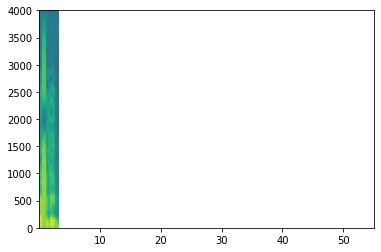

In [17]:
x= graph_spectrogram("Ec.wav")

In [18]:
x.shape

(101, 5511)

In [40]:
x=x.swapaxes(0,1)
x.shape


(5511, 101)

In [41]:
x = np.expand_dims(x, axis=1)
print(x.shape)
x

(5511, 1, 101)


array([[[3.56323261e+03, 5.33683571e+03, 6.20600975e+03, ...,
         9.46138837e-04, 1.93778080e-03, 3.10465085e-03]],

       [[1.52452917e+04, 2.96132045e+04, 1.78437699e+04, ...,
         4.90034879e-03, 2.42786787e-03, 9.66171615e-05]],

       [[2.57857643e+04, 3.25938939e+04, 1.29172303e+03, ...,
         3.09578712e-03, 9.60461225e-03, 1.54456893e-03]],

       ...,

       [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

       [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

       [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]]])

Once you've estimated the probability of having detected the word "activate" at each output step, you can trigger a "chiming" sound to play when the probability is above a certain threshold. Further, $y^{\langle t \rangle}$ might be near 1 for many values in a row after "activate" is said, yet we want to chime only once. So we will insert a chime sound at most once every 75 output steps. This will help prevent us from inserting two chimes for a single instance of "activate". (This plays a role similar to non-max suppression from computer vision.) 

<!-- 
**Exercise**: Implement chime_on_activate(). You will need to do the following:

1. Loop over the predicted probabilities at each output step
2. When the prediction is larger than the threshold and more than 75 consecutive time steps have passed, insert a "chime" sound onto the original audio clip

Use this code to convert from the 1,375 step discretization to the 10,000 step discretization and insert a "chime" using pydub:

` audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio.duration_seconds)*1000)
`
!--> 

In [19]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Step 1: Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    # Step 2: Loop over the output steps in the y
    for i in range(Ty):
        # Step 3: Increment consecutive output steps
        consecutive_timesteps += 1
        # Step 4: If prediction is higher than the threshold and more than 75 consecutive output steps have passed
        if predictions[0,i,0] > threshold and consecutive_timesteps > 75:
            # Step 5: Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            # Step 6: Reset consecutive output steps to 0
            
            consecutive_timesteps = 0
    #print("yes it reached me") 
    #print("hello",predictions[0,i,0])
    audio_clip.export("chime_output.wav", format='wav')

## 3.3 - Test on dev examples

Let's explore how our model performs on two unseen audio clips from the development set. Lets first listen to the two dev set clips. 

In [43]:
IPython.display.Audio("./testdata.wav")

## AUTOMATED SCRIPT

In [21]:
import soundfile as sf
import librosa
from IPython.display import Audio
from scipy.signal import butter, lfilter, freqz,filtfilt
from termcolor import colored

## Energy calculation

energy of Activate of the chunk 400-402 is 0.03992569446563721 Energy of noise 1.7390879392623901
initial pos 400 0.6720921
pos 400 probablity 0.39930776
New energy 37.87569808959961 scaling 43.55811370442582
energy of Activate of the chunk 402-404 is 0.012558051384985447 Energy of noise 1.7390879392623901
initial pos 402 0.62543505
pos 402 probablity 0.30595353
New energy 120.41783905029297 scaling 138.48390056292206
energy of Activate of the chunk 404-406 is 0.05178403481841087 Energy of noise 1.7390879392623901
initial pos 404 0.88700897
pos 404 probablity 0.70581985
New energy 29.202312469482422 scaling 33.58347694150879
pos 404 probablity 0.8228957
New energy 4903.57568359375 scaling 167.91738470754396
pos 404 probablity 0.8228957
New energy 4116978.25 scaling 839.5869235377198
pos 404 probablity 0.8228957
New energy 17282805760.0 scaling 4197.934617688599
pos 404 probablity 0.8228957
New energy 362760420458496.0 scaling 20989.673088442996


KeyboardInterrupt: 

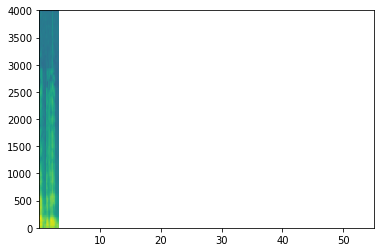

In [57]:
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")
whitenoise01=AudioSegment.from_wav("./Paper data/ECC/Energy/WN SNR-10 BW 0-8000 window length 2.0.wav")
#noise,rate=librosa.load("./Paper data/ECC/Energy/WN SNR0 BW 0-8000 window length 2.0.wav")
end=len(sound)
wnlen=len(whitenoise01)
nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
start=nonsil[0]
nonsilstart=start[0]
total=10001-end
trailsil = AudioSegment.silent(duration=total)
final=sound+trailsil
i=400
pos=400
#c=0
#end=len(sound)


while i<=410 and pos<=410:
    noise,rt=librosa.load("./Paper data/ECC/Energy/WN SNR-10 BW 0-8000 window length 2.0.wav")

    sound1=sound[i:i+2]
    sou1=sound1.export("chunk1.wav",format="wav")
    s1, rate = librosa.load("./chunk1.wav")
    amp=np.mean(s1**2)
    es=len(sound1)*amp
    en=len(whitenoise01)*np.mean(noise**2)
    print("energy of Activate of the chunk {}-{} is".format(i,i+2),es,"Energy of noise",en)
    const=en/es
    combined = final.overlay(whitenoise01,position=i)
    triggername  = combined.export("Ec.wav",format="wav")
    prediction = detect_triggerword(triggername)
    chime_on_activate(triggername, prediction, 0.5)
    probablity=max(prediction[0,:,0])
    print("initial pos",pos,probablity)
    while probablity>0.5: 
        noise=noise*(math.sqrt(const))
        sf.write("./Paper data/ECC/constener.wav",noise,22050)
        white_noise=AudioSegment.from_wav("./Paper data/ECC/constener.wav")
        
        overlaying = final.overlay(white_noise,position=i)
        detect  = overlaying.export("overlaid.wav",format="wav")
        predicts = detect_triggerword(detect)
        chime_on_activate(detect, predicts, 0.5)
        probablity=max(predicts[0,:,0])
        en=len(white_noise)*np.mean(noise**2)
        print("pos",pos,"probablity",probablity)
        print(colored("New energy {} scaling {}".format(np.mean(noise**2),const),"red",attrs=['bold']))
        const=const*5
    i+=2
    pos+=2

In [ ]:
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")
whitenoise01=AudioSegment.from_wav("./Paper data/ECC/Energy/WN SNR0 BW 0-8000 window length 2.0.wav")
noise,rate=librosa.load("./Paper data/ECC/Energy/WN SNR0 BW 0-8000 window length 2.0.wav")
end=len(sound)
wnlen=len(whitenoise01)
nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
start=nonsil[0]
nonsilstart=start[0]
total=10001-end
trailsil = AudioSegment.silent(duration=total)
final=sound+trailsil
i=start[0]
pos=0
#c=0
#end=len(sound)


while i<=end and pos<=end:
    sound1=sound[i:i+2]
    sou1=sound1.export("chunk1.wav",format="wav")
    s1, rate = librosa.load("./chunk1.wav")
    amp=np.mean(s1**2)
    es=len(sound1)*amp
    noise,rate=librosa.load("./Paper data/ECC/Energy/WN SNR0 BW 0-8000 window length 2.0.wav")
    en=len(whitenoise01)*np.mean(noise**2)
    #print("energy of Activate of the chunk {}-{} is".format(i,i+2),es,"Energy of noise",en)
    const=es/en
    combined = final.overlay(whitenoise01,position=i)
    triggername  = combined.export("Ec.wav",format="wav")
    prediction = detect_triggerword(triggername)
    chime_on_activate(triggername, prediction, 0.5)
    probablity=max(prediction[0,:,0])
    #print("initial pos",pos,probablity)
    if probablity<0.5:
        print(pos,"A",en,es)
    else:
        while probablity>0.5 and en<=500*es: 
            noise=noise*5*math.sqrt(const)
            sf.write("./Paper data/ECC/constener.wav",noise,22050)
            white_noise=AudioSegment.from_wav("./Paper data/ECC/constener.wav")

            overlaying = final.overlay(white_noise,position=i)
            detect  = overlaying.export("overlaid.wav",format="wav")
            predicts = detect_triggerword(detect)
            chime_on_activate(detect, predicts, 0.5)
            probablity=max(predicts[0,:,0])
            en=len(white_noise)*np.mean(noise**2)
            #print("pos",pos,"probablity",probablity)
            #print(colored("New energy {} scaling {}".format(np.mean(noise**2),const),"red",attrs=['bold']))
            const=const*5
            if probablity<0.5 and en<=500*es:
                print(pos,"A",en,es)
        else:
            print(colored("{} NA {} {}".format(pos,en,es),"red",attrs=['bold']))



    #print(colored("energy required to interrupt wake word detection at pos {} is {}::energy at pos {} is {}".format(pos,en,pos,es),"green",attrs=['bold']))
    i+=2
    pos+=2

In [ ]:
for p in preds:
            if p>0.5:
                #print(pos,p)
                predicts.append(p)
        l=len(predicts)      
        print(pos,l)
        count.append({'position':pos,'count':l})
        df=pd.DataFrame(count)
        
        predicts.clear()

## Improving Energy Graph

WN SNR0 BW 0-8000 window length 128
0 A 1.715819239616394 3.471012592315674 128
2 A 1.715819239616394 3.443804979324341 128
4 A 1.715819239616394 3.4348349571228027 128
6 A 1.715819239616394 3.4172263145446777 128
8 A 1.715819239616394 3.3966853618621826 128
10 A 1.715819239616394 3.3452277183532715 128
12 A 1.715819239616394 3.3181586265563965 128
14 A 1.715819239616394 3.2671191692352295 128
16 A 1.715819239616394 3.2176053524017334 128
18 A 1.715819239616394 3.129105567932129 128
20 A 1.715819239616394 3.1061503887176514 128
22 A 1.715819239616394 2.9062881469726562 128
24 A 1.715819239616394 2.8541173934936523 128
26 A 1.715819239616394 2.667877674102783 128
28 A 1.715819239616394 2.600397825241089 128
30 A 1.715819239616394 2.4967639446258545 128
32 A 1.715819239616394 2.37069034576416 128
34 A 1.715819239616394 2.3579607009887695 128
36 A 1.715819239616394 2.161057472229004 128
38 A 1.715819239616394 2.1206958293914795 128
40 A 1.715819239616394 1.9094421863555908 128
42 A 1.7158

358 NA 0 1.5684401988983154 128
360 A 1747.7994384765625 1.5489113330841064 128
362 A 37.4852180480957 1.4994086027145386 128
364 A 36.3813591003418 1.4552544355392456 128
366 NA 0 1.4248265027999878 128
368 A 33.74869918823242 1.3499480485916138 128
370 A 33.24943161010742 1.3299773931503296 128
372 A 1128.2406005859375 1.2444618940353394 128
374 NA 0 1.2198524475097656 128
376 A 29.57379722595215 1.182951807975769 128
378 NA 0 1.1214879751205444 128
380 NA 0 1.1058017015457153 128
382 A 767.9658203125 1.0267192125320435 128
384 A 25.131244659423828 1.0052498579025269 128
386 NA 0 0.9548761248588562 128
388 NA 0 0.921944260597229 128
390 A 22.358564376831055 0.8943425416946411 128
392 NA 0 0.8445239067077637 128
394 NA 0 0.831402063369751 128
396 NA 0 0.7807955145835876 128
398 NA 0 0.7657613158226013 128
400 A 18.620908737182617 0.7448362708091736 128
402 NA 0 0.7049681544303894 128
404 A 349.5218811035156 0.6926565170288086 128
406 A 16.025890350341797 0.6410355567932129 128
408 A 2

96 A 1.7158328294754028 0.01916307955980301 16
98 A 1.7158328294754028 0.015684636309742928 16
100 A 1.7158328294754028 0.013505812734365463 16
102 A 1.7158328294754028 0.013063940219581127 16
104 A 1.7158328294754028 0.012935211881995201 16
106 A 1.7158328294754028 0.011249616742134094 16
108 A 1.7158328294754028 0.008701542392373085 16
110 A 1.7158328294754028 0.007821762934327126 16
112 A 1.7158328294754028 0.0065107266418635845 16
114 A 1.7158328294754028 0.0064142863266170025 16
116 A 1.7158328294754028 0.005413152743130922 16
118 A 1.7158328294754028 0.00539395771920681 16
120 A 1.7158328294754028 0.004802660085260868 16
122 A 1.7158328294754028 0.004830325488001108 16
124 A 1.7158328294754028 0.004364923108369112 16
126 A 1.7158328294754028 0.004102762322872877 16
128 A 1.7158328294754028 0.004017090890556574 16
130 A 1.7158328294754028 0.0032775860745459795 16
132 A 1.7158328294754028 0.003010871121659875 16
134 A 1.7158328294754028 0.0023599944543093443 16
136 A 1.715832829475

456 A 57.880859375 0.0584796778857708 16
458 A 4.83674430847168 0.04847646877169609 16
460 A 1.7158328294754028 0.0368528738617897 16
462 A 1.7158328294754028 0.03650346398353577 16
464 NA 0 0.022149326279759407 16
466 A 1.7158328294754028 0.02446545474231243 16
468 A 1.7158328294754028 0.019377946853637695 16
470 A 1.7158328294754028 0.016474494710564613 16
472 A 9.433353424072266 0.016118519008159637 16
474 A 1.7158328294754028 0.014475718140602112 16
476 A 1.7158328294754028 0.011259420774877071 16
478 A 54.74020004272461 0.009352095425128937 16
480 A 1.7158328294754028 0.007832514122128487 16
482 A 1.7158328294754028 0.005369043443351984 16
484 A 1.7158328294754028 0.005429891403764486 16
486 NA 0 0.004813899286091328 16
488 A 1.7158328294754028 0.0047946288250386715 16
490 A 1.7158328294754028 0.004664488602429628 16
492 A 1.7158328294754028 0.0052177817560732365 16
494 A 1.7158328294754028 0.005127693526446819 16
496 A 1.7158328294754028 0.006179741583764553 16
498 A 1.7158328294

246 NA 0 0.02347746677696705 2
248 A 1.1382099390029907 0.018609920516610146 2
250 A 1.1382099390029907 0.012347225099802017 2
252 NA 0 0.02492021955549717 2
254 A 1.1382099390029907 0.003189877374097705 2
256 A 1.1382099390029907 0.026818184182047844 2
258 A 1.1382099390029907 0.002661958336830139 2
260 NA 0 0.006193037144839764 2
262 A 1.1382099390029907 0.02067914791405201 2
264 A 1.1382099390029907 0.0010752732632681727 2
266 A 1.1382099390029907 0.018260596320033073 2
268 A 1.1382099390029907 0.001714030746370554 2
270 A 1.1382099390029907 0.0048636808060109615 2
272 A 1.1382099390029907 0.0050164032727479935 2
274 NA 0 0.006682910490781069 2
276 A 1.1382099390029907 0.007219960913062096 2
278 A 1.1382099390029907 0.0013358702417463064 2
280 A 1.1382099390029907 0.006221245042979717 2
282 NA 0 0.0030684766825288534 2
284 A 1.1382099390029907 0.003199704922735691 2
286 A 1.1382099390029907 0.004902258049696684 2
292 A 1.1382099390029907 0.0010446235537528992 2
294 A 1.1382099390029

142 A 1.7158104181289673 1.87876296043396 256
144 A 1.7158104181289673 1.9001823663711548 256
146 A 1.7158104181289673 1.9397947788238525 256
148 A 1.7158104181289673 1.9522645473480225 256
150 A 1.7158104181289673 2.0039124488830566 256
152 A 1.7158104181289673 2.0135326385498047 256
154 A 1.7158104181289673 2.0364420413970947 256
156 A 1.7158104181289673 2.0715763568878174 256
158 A 52.16886901855469 2.086754560470581 256
160 A 53.27109146118164 2.130843162536621 256
162 A 53.561763763427734 2.142470359802246 256
164 A 54.380088806152344 2.175203561782837 256
166 A 54.83955764770508 2.193582057952881 256
168 A 55.214176177978516 2.208566665649414 256
170 A 56.09465789794922 2.243786096572876 256
172 A 56.42453384399414 2.256981372833252 256
174 A 57.31110382080078 2.2924439907073975 256
176 A 57.50218200683594 2.3000872135162354 256
178 A 58.23015213012695 2.3292057514190674 256
180 A 58.8485107421875 2.353940486907959 256
182 A 59.283199310302734 2.3713276386260986 256
184 A 60.1192

504 A 6.935012340545654 0.03440557103022002 256
506 A 6.618544101715088 0.034006159694399685 256
508 A 5.867995738983154 0.032998137117829174 256
510 A 5.404982566833496 0.03232700901571661 256
512 A 4.611546993255615 0.03106909667258151 256
514 A 4.502372741699219 0.03088355652289465 256
516 A 4.2709879875183105 0.030478883563773707 256
518 A 3.8781418800354004 0.029752462229225785 256
520 A 3.0814895629882812 0.02809034683741629 256
522 A 2.8270034790039062 0.027491506654769182 256
524 A 12.478898048400879 0.025515887318761088 256
526 A 9.479409217834473 0.02415080882201437 256
528 A 8.457991600036621 0.02360635285731405 256
530 A 8.028027534484863 0.023361311803455465 256
532 A 7.540747165679932 0.023070569790434092 256
534 A 7.461567401885986 0.023021915621939115 256
536 A 7.415773391723633 0.02299358689924702 256
538 A 6.835859775543213 0.02262215971131809 256
540 A 6.526322841644287 0.022413473314372823 256
542 A 6.35504674911499 0.022294573922408745 256
544 A 5.942514896392822 0

234 A 7.379159927368164 0.2951664328575134 32
236 A 6.4945268630981445 0.2597810924053192 32
238 A 5.947010040283203 0.2378804087638855 32
240 A 5.249489784240723 0.2099795937538147 32
242 A 1.715811848640442 0.20506161451339722 32
244 A 1.715811848640442 0.18089774250984192 32
246 A 1.715811848640442 0.18496112525463104 32
248 A 1.715811848640442 0.1626671850681305 32
250 A 1.715811848640442 0.14976826310157776 32
252 A 1.715811848640442 0.14046671986579895 32
254 A 1.715811848640442 0.1187504455447197 32
256 A 1.715811848640442 0.12037349492311478 32
258 A 1.715811848640442 0.09403231739997864 32
260 A 1.715811848640442 0.09267953038215637 32
262 A 1.715811848640442 0.08760099112987518 32
264 A 1.715811848640442 0.0682128444314003 32
266 A 1.715811848640442 0.06731860339641571 32
268 A 1.715811848640442 0.050148334354162216 32
270 A 1.715811848640442 0.049561869353055954 32
272 A 1.715811848640442 0.04505375027656555 32
274 A 1.715811848640442 0.04082445800304413 32
276 A 7.505497932

582 A 8.259952545166016 0.007383089978247881 32
584 A 7.495421886444092 0.0072939954698085785 32
586 A 5.842195987701416 0.007070302497595549 32
588 A 4.089415550231934 0.006761975586414337 32
590 A 1.715811848640442 0.006606842391192913 32
592 A 3.2416863441467285 0.006568441167473793 32
594 A 59.15558624267578 0.00635690800845623 32
596 A 45.4253044128418 0.006173077039420605 32
598 A 1.715811848640442 0.004473728593438864 32
606 A 1.715811848640442 0.0017710726751829498 32
612 A 1.715811848640442 3.699935158252288e-08 32
620 A 1.715811848640442 3.9111595212526495e-10 32
626 A 1.715811848640442 2.420867152574946e-10 32
628 A 1.715811848640442 1.12775039307067e-10 32
WN SNR0 BW 0-8000 window length 4
0 NA 0 0.03637400642037392 4
2 NA 0 0.027719801291823387 4
4 NA 0 0.039388809353113174 4
6 NA 0 0.0735807865858078 4
8 NA 0 0.07649741321802139 4
10 NA 0 0.07697263360023499 4
12 NA 0 0.1003517434000969 4
14 NA 0 0.13791491091251373 4
16 NA 0 0.11179222911596298 4
18 NA 0 0.22017183899879

366 A 1.5453773736953735 0.095130056142807 4
368 A 2.6160356998443604 0.10464143007993698 4
370 A 1.5453773736953735 0.11108693480491638 4
372 A 1.5453773736953735 0.06343395262956619 4
374 A 1.5453773736953735 0.09976014494895935 4
376 A 1.947557806968689 0.07790230959653854 4
378 A 1.5453773736953735 0.09547758847475052 4
380 A 1.5453773736953735 0.10217180103063583 4
382 A 1.8211935758590698 0.07284773886203766 4
384 A 1.5453773736953735 0.08405055850744247 4
386 A 1.5453773736953735 0.0592445507645607 4
388 A 1.5453773736953735 0.07909165322780609 4
390 A 1.5453773736953735 0.06500009447336197 4
392 A 1.5453773736953735 0.06584134697914124 4
394 A 1.5453773736953735 0.06918498873710632 4
396 A 1.5453773736953735 0.03764872997999191 4
398 A 1.5453773736953735 0.060965366661548615 4
400 A 1.5453773736953735 0.05251822620630264 4
402 A 1.5453773736953735 0.06441593170166016 4
404 A 1.5453773736953735 0.06187938153743744 4
406 A 1.5453773736953735 0.03257937356829643 4
408 A 1.54537737

84 A 1.7158119678497314 0.1885705143213272 64
86 A 1.7158119678497314 0.12124717980623245 64
88 A 1.7158119678497314 0.11008481681346893 64
90 A 1.7158119678497314 0.0665891245007515 64
92 A 1.7158119678497314 0.060020603239536285 64
94 A 1.7158119678497314 0.04161188006401062 64
96 A 1.7158119678497314 0.03207387030124664 64
98 A 1.7158119678497314 0.02794082835316658 64
100 A 1.7158119678497314 0.02539631351828575 64
102 A 1.7158119678497314 0.02575492113828659 64
104 A 1.7158119678497314 0.024944880977272987 64
106 A 1.7158119678497314 0.022803276777267456 64
108 A 1.7158119678497314 0.02003258839249611 64
110 A 1.7158119678497314 0.019187739118933678 64
112 A 1.7158119678497314 0.018870288506150246 64
114 A 1.7158119678497314 0.01813197322189808 64
116 A 1.7158119678497314 0.016962559893727303 64
118 A 1.7158119678497314 0.016476135700941086 64
120 A 1.7158119678497314 0.016063928604125977 64
122 A 1.7158119678497314 0.015788864344358444 64
124 A 1.7158119678497314 0.01521345227956

508 A 1.7158119678497314 0.024665765464305878 64
510 A 1.7158119678497314 0.02427549846470356 64
512 A 1.7158119678497314 0.023134684190154076 64
514 A 7.547104835510254 0.023074474185705185 64
516 A 1.7158119678497314 0.02307082712650299 64
518 A 1.7158119678497314 0.022356688976287842 64
520 NA 0 0.020800290629267693 64
522 NA 0 0.02042488381266594 64
524 A 2.6805167198181152 0.01875942200422287 64
526 NA 0 0.017534289509058 64
528 NA 0 0.017033033072948456 64
530 NA 0 0.017002595588564873 64
532 A 1.7158119678497314 0.016891654580831528 64
534 A 2.5247323513031006 0.018536118790507317 64
536 NA 0 0.01994393765926361 64
538 NA 0 0.020379764959216118 64
540 NA 0 0.02064688317477703 64
542 NA 0 0.02053024061024189 64
544 NA 0 0.020250411704182625 64
546 NA 0 0.0206048171967268 64
548 NA 0 0.020630374550819397 64
550 NA 0 0.017606953158974648 64
552 NA 0 0.01536061242222786 64
554 NA 0 0.014399044215679169 64
556 NA 0 0.013467923738062382 64
558 NA 0 0.013383387587964535 64
560 NA 0 0.0

276 A 1.6569526195526123 0.017896601930260658 8
278 A 1.6569526195526123 0.013883134350180626 8
280 A 1.6569526195526123 0.01744355447590351 8
282 A 1.6569526195526123 0.011644748970866203 8
284 A 1.6569526195526123 0.01000658143311739 8
286 A 1.6569526195526123 0.007926445454359055 8
288 A 1.6569526195526123 0.004265726078301668 8
290 A 1.6569526195526123 0.003995442762970924 8
292 A 1.6569526195526123 0.0034952322021126747 8
294 A 1.6569526195526123 0.0037383330054581165 8
296 A 1.6569526195526123 0.0029093828052282333 8
298 A 1.6569526195526123 0.003457367653027177 8
300 A 1.6569526195526123 0.0035117031075060368 8
302 A 1.6569526195526123 0.00276821106672287 8
304 A 1.6569526195526123 0.003258856013417244 8
306 A 1.6569526195526123 0.004145290236920118 8
308 A 1.6569526195526123 0.0033331792801618576 8
310 A 1.6569526195526123 0.003255287418141961 8
312 A 1.6569526195526123 0.0028609884902834892 8
314 A 1.6569526195526123 0.001632958767004311 8
318 A 1.6569526195526123 0.0024997328

622 A 1.6569526195526123 3.035232343240324e-10 8
624 A 1.6569526195526123 2.9582408744843747e-10 8
626 A 1.6569526195526123 2.420867152574946e-10 8
628 A 1.6569526195526123 1.12775039307067e-10 8
630 A 1.6569526195526123 3.978655599423675e-11 8


IndexError: list index out of range

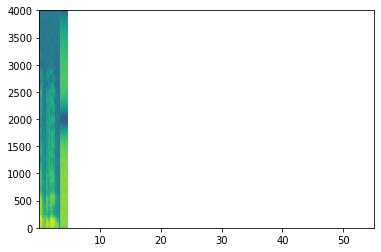

In [95]:
path="./Paper data/ECC/EN1/"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")

filenum=os.listdir(path)
while index<=len(filenum):
    filenames=glob.glob(os.path.join(path, '*.wav'))
    whitenoise1=AudioSegment.from_wav(filenames[index])
    noise,rate=librosa.load(filenames[index])
    end=len(sound)
    wnlen=len(whitenoise1)
    #print(wnlen)
    nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
    start=nonsil[0]
    nonsilstart=start[0]
    total=10001-end
    trailsil = AudioSegment.silent(duration=total)
    final=sound+trailsil
    i=start[0]
    pos=0
    print("{}".format(os.path.basename(filenames[index]).split(".")[0]))
    while i<=end and pos<=end:
        sound1=sound[i:i+wnlen]
        sou1=sound1.export("chunkwn.wav",format="wav")
        s1, rate = librosa.load("./chunkwn.wav")
        amp=np.mean(s1**2)
        es=len(sound1)*amp
        noise,rate=librosa.load(filenames[index])
        en=wnlen*np.mean(noise**2)
        #print("len of activate chunk is",len(sound1))
        #print("energy of Activate of the chunk {}-{} is".format(i,i+2),es,"Energy of noise",en)
        const=es/en
        combined = final.overlay(whitenoise1,position=i)
        triggername  = combined.export("Ecwn.wav",format="wav")
        prediction = detect_triggerword(triggername)
        chime_on_activate(triggername, prediction, 0.5)
        probablity=max(prediction[0,:,0])
        #print("initial pos",pos,probablity,"Initial Energy",en)
        if probablity<0.5:
            print(pos,"A",en,es,len(whitenoise1))
        else:
            while probablity>0.5 and en<=500*es:
                #print("energy then",en)
                noise=noise*5*math.sqrt(const)
                sf.write("./Paper data/ECC/constener{}.wav".format(i),noise,22050)
                white_noise=AudioSegment.from_wav("./Paper data/ECC/constener1.wav")

                overlaying = final.overlay(white_noise,position=i)
                detect  = overlaying.export("overlaid1.wav",format="wav")
                predicts = detect_triggerword(detect)
                chime_on_activate(detect, predicts, 0.5)
                probablity=max(predicts[0,:,0])
                en=len(white_noise)*np.mean(noise**2)
                #print("pos",pos,"probablity",probablity,"energy",en)
                #print(colored("New energy {} scaling {}".format(np.mean(noise1**2),const),"red",attrs=['bold']))
                const=const*2
                if probablity<0.5:
                    print(pos,"A",en,es,len(whitenoise1))
                elif probablity>0.5 and en>500*es:
                    print(pos,"NA",0,es,len(whitenoise1))
        i+=2
        pos+=2
    index+=1
   
        #print(colored("energy required to interrupt wake word detection at pos {} is {}::energy at pos {} is {}".format(pos,en,pos,es),"green",attrs=['bold']))


## Improving Energy Graph ENC

WN SNR0 0-8000 time 2
initial pos 80 0.9940554 energy 0.019139399752020836
pos 80 probablity 0.99316555 0.06701891869306564
pos 80 probablity 0.9870962 0.29334351420402527
pos 80 probablity 0.07079154 1.6049652099609375
80 A 1.6049652099609375 0.06701891124248505
80 NA 1.6049652099609375 0.06701891124248505
initial pos 82 0.99416685 energy 0.019139399752020836
pos 82 probablity 0.9942954 0.0037178441416472197
pos 82 probablity 0.99431944 0.0009027429041452706
pos 82 probablity 0.99432486 0.00027399774990044534
pos 82 probablity 0.9943258 0.00010395369463367388
pos 82 probablity 0.99432594 4.9299535021418706e-05
pos 82 probablity 0.9943258 2.922507883340586e-05
pos 82 probablity 0.9943257 2.165602199966088e-05
pos 82 probablity 0.9943257 2.0059111193404533e-05
pos 82 probablity 0.9943257 2.3224942196975462e-05
pos 82 probablity 0.9943258 3.3613025152590126e-05
pos 82 probablity 0.99432594 6.08093905611895e-05
pos 82 probablity 0.9943257 0.00013751297956332564
pos 82 probablity 0.9943238

pos 100 probablity 0.9943246 3.0823985031069867e-10
pos 100 probablity 0.99432474 6.692046916612071e-10
pos 100 probablity 0.99432474 1.8160973835890104e-09
pos 100 probablity 0.99432474 6.160688403866743e-09
pos 100 probablity 0.99432474 2.6123386120957548e-08
pos 100 probablity 0.99432474 1.3846489821389696e-07
pos 100 probablity 0.99432474 9.174023603009118e-07
pos 100 probablity 0.99432474 7.597839157824637e-06
pos 100 probablity 0.9943241 7.865572115406394e-05
pos 100 probablity 0.9943118 0.0010178425582125783
pos 100 probablity 0.9940653 0.01646420918405056
pos 100 probablity 0.07079154 0.33289802074432373
100 A 0.33289802074432373 0.0011696023866534233
100 NA 0.33289802074432373 0.0011696023866534233
initial pos 102 0.99394184 energy 0.019139399752020836
pos 102 probablity 0.99430424 0.0011433563195168972
pos 102 probablity 0.99432206 8.537778194295242e-05
pos 102 probablity 0.9943241 7.969263606355526e-06
pos 102 probablity 0.9943245 9.298255463363603e-07
pos 102 probablity 0.9

pos 112 probablity 0.99432474 6.743160196887032e-11
pos 112 probablity 0.99432474 5.680107426075942e-11
pos 112 probablity 0.99432474 5.980803352567676e-11
pos 112 probablity 0.99432474 7.871771984246934e-11
pos 112 probablity 0.99432474 1.295076823559782e-10
pos 112 probablity 0.99432474 2.6633523164676376e-10
pos 112 probablity 0.99432474 6.846549438499494e-10
pos 112 probablity 0.99432474 2.2000106181252477e-09
pos 112 probablity 0.99432474 8.83665407513945e-09
pos 112 probablity 0.99432474 4.436709843957942e-08
pos 112 probablity 0.99432474 2.7844805572385667e-07
pos 112 probablity 0.99432486 2.184425966333947e-06
pos 112 probablity 0.99432534 2.142103767255321e-05
pos 112 probablity 0.9943264 0.0002625751949381083
pos 112 probablity 0.9943007 0.004023248329758644
pos 112 probablity 0.99001896 0.0770566388964653
pos 112 probablity 0.07079154 1.8448165655136108
112 A 1.8448165655136108 0.001107901567593217
112 NA 1.8448165655136108 0.001107901567593217
initial pos 114 0.99401325 ene

pos 122 probablity 0.9943246 2.2677566421935857e-11
pos 122 probablity 0.9943246 7.052318364703103e-12
pos 122 probablity 0.9943246 2.7414307803008686e-12
pos 122 probablity 0.9943246 1.332087543569338e-12
pos 122 probablity 0.9943246 8.090925932707771e-13
pos 122 probablity 0.9943246 6.142902484428114e-13
pos 122 probablity 0.9943246 5.829872717390272e-13
pos 122 probablity 0.9943246 6.915993927721076e-13
pos 122 probablity 0.9943246 1.0255577853959807e-12
pos 122 probablity 0.9943246 1.9009715676587824e-12
pos 122 probablity 0.9943246 4.404546605912829e-12
pos 122 probablity 0.9943246 1.2756653372525406e-11
pos 122 probablity 0.9943246 4.618301574499384e-11
pos 122 probablity 0.9943246 2.0899594554979473e-10
pos 122 probablity 0.9943246 1.182233977381486e-09
pos 122 probablity 0.9943246 8.359474890085039e-09
pos 122 probablity 0.9943245 7.388641165562149e-08
pos 122 probablity 0.9943243 8.163195275301405e-07
pos 122 probablity 0.994323 1.1273685231572017e-05
pos 122 probablity 0.9943

pos 130 probablity 0.99432474 3.254987474131686e-17
pos 130 probablity 0.99432474 1.2839072628085488e-16
pos 130 probablity 0.99432474 6.330355259050993e-16
pos 130 probablity 0.99432474 3.901507870436192e-15
pos 130 probablity 0.99432474 3.005708949419504e-14
pos 130 probablity 0.99432474 2.894485324166085e-13
pos 130 probablity 0.99432474 3.4842224591602466e-12
pos 130 probablity 0.99432474 5.242643125180635e-11
pos 130 probablity 0.99432474 9.86063120045344e-10
pos 130 probablity 0.99432474 2.3182975539270956e-08
pos 130 probablity 0.99432486 6.813083359702432e-07
pos 130 probablity 0.9943252 2.5028119125636294e-05
pos 130 probablity 0.9943116 0.001149271847680211
pos 130 probablity 0.989717 0.06596708297729492
pos 130 probablity 0.07079154 4.733058452606201
130 A 4.733058452606201 0.0003565105434972793
130 NA 4.733058452606201 0.0003565105434972793
initial pos 132 0.993883 energy 0.019139399752020836
pos 132 probablity 0.9943089 0.000706441467627883
pos 132 probablity 0.9943245 3.2

pos 138 probablity 0.9943246 1.703101992767131e-09
pos 138 probablity 0.9943246 4.6243822993119466e-08
pos 138 probablity 0.9943246 1.5695554793637712e-06
pos 138 probablity 0.9943229 6.6590124333743e-05
pos 138 probablity 0.99425286 0.003531448310241103
pos 138 probablity 0.1900158 0.23410239815711975
138 A 0.23410239815711975 0.00032939037191681564
138 NA 0.23410239815711975 0.00032939037191681564
initial pos 140 0.9938763 energy 0.019139399752020836
pos 140 probablity 0.9943164 0.0002702169003896415
pos 140 probablity 0.9943246 4.768774488184135e-06
pos 140 probablity 0.99432474 1.051988576250551e-07
pos 140 probablity 0.99432474 2.900849782605519e-09
pos 140 probablity 0.99432474 9.998835787117244e-11
pos 140 probablity 0.99432474 4.308079934456366e-12
pos 140 probablity 0.99432474 2.320214062111886e-13
pos 140 probablity 0.99432474 1.5620046488890038e-14
pos 140 probablity 0.99432474 1.314457914801219e-15
pos 140 probablity 0.99432474 1.3826779219033007e-16
pos 140 probablity 0.99

pos 146 probablity 0.9943246 1.2854658910422793e-30
pos 146 probablity 0.9943246 6.815623451152418e-31
pos 146 probablity 0.9943246 4.51710881732855e-31
pos 146 probablity 0.9943246 3.7421879115348434e-31
pos 146 probablity 0.9943246 3.8752571634321087e-31
pos 146 probablity 0.9943246 5.016325281399604e-31
pos 146 probablity 0.9943246 8.11672360513973e-31
pos 146 probablity 0.9943246 1.641670019680429e-30
pos 146 probablity 0.9943246 4.1505050431489014e-30
pos 146 probablity 0.9943246 1.3116746002407554e-29
pos 146 probablity 0.9943246 5.181568265068706e-29
pos 146 probablity 0.9943246 2.558623208948963e-28
pos 146 probablity 0.9943246 1.5792886507482798e-27
pos 146 probablity 0.9943246 1.218502980930354e-26
pos 146 probablity 0.9943246 1.175172993040662e-25
pos 146 probablity 0.9943246 1.4167297950055485e-24
pos 146 probablity 0.9943246 2.1349228245643932e-23
pos 146 probablity 0.9943246 4.0214945025720626e-22
pos 146 probablity 0.9943246 9.468968308648221e-21
pos 146 probablity 0.994

pos 152 probablity 0.9943246 2.9236668641630104e-10
pos 152 probablity 0.9943246 2.5889166366255267e-09
pos 152 probablity 0.9943245 2.8656176098706965e-08
pos 152 probablity 0.99432445 3.96486484532943e-07
pos 152 probablity 0.99432373 6.857228072476573e-06
pos 152 probablity 0.9943178 0.00014824456593487412
pos 152 probablity 0.99421424 0.00400607381016016
pos 152 probablity 0.9035604 0.13532224297523499
pos 152 probablity 0.07079154 5.7138590812683105
152 A 5.7138590812683105 0.0006402773433364928
152 NA 5.7138590812683105 0.0006402773433364928
initial pos 154 0.99355125 energy 0.019139399752020836
pos 154 probablity 0.9943141 0.00027613810379989445
pos 154 probablity 0.9943243 4.980057838110952e-06
pos 154 probablity 0.9943246 1.1226707385958434e-07
pos 154 probablity 0.9943246 3.1635920549888397e-09
pos 154 probablity 0.9943246 1.1143420214354549e-10
pos 154 probablity 0.9943246 4.906441572471998e-12
pos 154 probablity 0.9943246 2.7003792539732896e-13
pos 154 probablity 0.9943246 

pos 160 probablity 0.99432474 1.1388741512352585e-13
pos 160 probablity 0.99432474 7.366952642536007e-13
pos 160 probablity 0.99432474 5.956757656577771e-12
pos 160 probablity 0.99432474 6.020631215797323e-11
pos 160 probablity 0.99432474 7.60648655173668e-10
pos 160 probablity 0.99432474 1.2012578487485825e-08
pos 160 probablity 0.99432486 2.3713646157830226e-07
pos 160 probablity 0.99432534 5.851544756296789e-06
pos 160 probablity 0.99432474 0.00018048979109153152
pos 160 probablity 0.9941843 0.006958967540413141
pos 160 probablity 0.21664357 0.33538758754730225
160 A 0.33538758754730225 0.00046772442874498665
160 NA 0.33538758754730225 0.00046772442874498665
initial pos 162 0.9938496 energy 0.019139399752020836
pos 162 probablity 0.99430627 0.0009713232866488397
pos 162 probablity 0.994325 6.161825149320066e-05
pos 162 probablity 0.9943251 4.8861284085433e-06
pos 162 probablity 0.99432486 4.843178089686262e-07
pos 162 probablity 0.99432474 6.00075722445581e-08
pos 162 probablity 0.9

pos 168 probablity 0.6919237 0.19600175321102142
pos 168 probablity 0.07079154 31.311023712158203
168 A 31.311023712158203 0.00016646583389956504
168 NA 31.311023712158203 0.00016646583389956504
initial pos 170 0.9937953 energy 0.019139399752020836
pos 170 probablity 0.994307 0.0005824926774948835
pos 170 probablity 0.994323 2.2159641957841814e-05
pos 170 probablity 0.99432445 1.0537679600020056e-06
pos 170 probablity 0.9943246 6.263790197635899e-08
pos 170 probablity 0.9943246 4.6541397402677376e-09
pos 170 probablity 0.9943246 4.3226663914985863e-10
pos 170 probablity 0.9943246 5.018500198739062e-11
pos 170 probablity 0.9943246 7.28293206991859e-12
pos 170 probablity 0.9943246 1.3211392700315794e-12
pos 170 probablity 0.9943246 2.995718094162686e-13
pos 170 probablity 0.9943246 8.491085167882523e-14
pos 170 probablity 0.9943246 3.0084001424995205e-14
pos 170 probablity 0.9943246 1.3323488600098295e-14
pos 170 probablity 0.9943246 7.375819756122361e-15
pos 170 probablity 0.9943246 5.1

pos 178 probablity 0.9943246 1.0043112433116717e-20
pos 178 probablity 0.9943246 1.8796627269146606e-21
pos 178 probablity 0.9943246 4.397456522322769e-22
pos 178 probablity 0.9943246 1.28597694010203e-22
pos 178 probablity 0.9943246 4.7008334938090445e-23
pos 178 probablity 0.9943246 2.1479619064667914e-23
pos 178 probablity 0.9943246 1.2268409763068773e-23
pos 178 probablity 0.9943246 8.759110750234263e-24
pos 178 probablity 0.9943246 7.817028602531269e-24
pos 178 probablity 0.9943246 8.720341392186271e-24
pos 178 probablity 0.9943246 1.2160047884823089e-23
pos 178 probablity 0.9943246 2.119566384866818e-23
pos 178 probablity 0.9943246 4.618158662131348e-23
pos 178 probablity 0.9943246 1.2577681576555404e-22
pos 178 probablity 0.9943246 4.281957693249805e-22
pos 178 probablity 0.9943246 1.8221926574910484e-21
pos 178 probablity 0.9943246 9.692952501097529e-21
pos 178 probablity 0.9943246 6.445075324169802e-20
pos 178 probablity 0.9943246 5.3568542171300265e-19
pos 178 probablity 0.99

pos 184 probablity 0.9943241 8.587955380789936e-05
pos 184 probablity 0.9942834 0.004586714785546064
pos 184 probablity 0.6696703 0.30621305108070374
pos 184 probablity 0.36278677 25.553813934326172
184 A 25.553813934326172 0.00033172621624544263
184 NA 25.553813934326172 0.00033172621624544263
initial pos 186 0.99417216 energy 0.019139399752020836
pos 186 probablity 0.99432546 0.0002260197070427239
pos 186 probablity 0.99432486 3.3363721740897745e-06
pos 186 probablity 0.99432474 6.156196974416162e-08
pos 186 probablity 0.9943246 1.4199096343148199e-09
pos 186 probablity 0.9943246 4.0937267464791205e-11
pos 186 probablity 0.9943246 1.4753226851987877e-12
pos 186 probablity 0.9943246 6.646073258788701e-14
pos 186 probablity 0.9943246 3.742426612612362e-15
pos 186 probablity 0.9943246 2.6342168794237105e-16
pos 186 probablity 0.9943246 2.317713919695403e-17
pos 186 probablity 0.9943246 2.5490478406543825e-18
pos 186 probablity 0.9943246 3.5043400668293034e-19
pos 186 probablity 0.994324

pos 190 probablity 0.99432474 1.6305008898598317e-07
pos 190 probablity 0.994325 9.30369697016431e-06
pos 190 probablity 0.9943246 0.000663590501062572
pos 190 probablity 0.99395293 0.059163615107536316
pos 190 probablity 0.07079154 6.593548774719238
190 A 6.593548774719238 0.00022682052804157138
190 NA 6.593548774719238 0.00022682052804157138
initial pos 192 0.9942808 energy 0.019139399752020836
pos 192 probablity 0.99432653 0.0006327808368951082
pos 192 probablity 0.9943256 2.6151003112317994e-05
pos 192 probablity 0.99432486 1.3509315976989456e-06
pos 192 probablity 0.99432474 8.723452538106358e-08
pos 192 probablity 0.99432474 7.04130931339364e-09
pos 192 probablity 0.99432474 7.104417054648593e-10
pos 192 probablity 0.99432474 8.96011528861429e-11
pos 192 probablity 0.99432474 1.412565897584983e-11
pos 192 probablity 0.99432474 2.7836446255674607e-12
pos 192 probablity 0.99432474 6.856916293443427e-13
pos 192 probablity 0.99432474 2.111319880862203e-13
pos 192 probablity 0.9943247

pos 198 probablity 0.9943246 1.5501443878518373e-11
pos 198 probablity 0.9943246 1.444635155858215e-13
pos 198 probablity 0.9943246 1.6828841066927783e-15
pos 198 probablity 0.9943246 2.4505313328028375e-17
pos 198 probablity 0.9943246 4.460425662609239e-19
pos 198 probablity 0.9943246 1.0148511722144739e-20
pos 198 probablity 0.9943246 2.8862799886193136e-22
pos 198 probablity 0.9943246 1.0260877088417081e-23
pos 198 probablity 0.9943246 4.559744715112612e-25
pos 198 probablity 0.9943246 2.5328337647688037e-26
pos 198 probablity 0.9943246 1.7586638916821766e-27
pos 198 probablity 0.9943246 1.526402036696423e-28
pos 198 probablity 0.9943246 1.6560179344553793e-29
pos 198 probablity 0.9943246 2.2458003889974012e-30
pos 198 probablity 0.9943246 3.807038524276488e-31
pos 198 probablity 0.9943246 8.067028053316062e-32
pos 198 probablity 0.9943246 2.1367303177626397e-32
pos 198 probablity 0.9943246 7.074501896124759e-33
pos 198 probablity 0.9943246 2.92787265621519e-33
pos 198 probablity 0.

KeyboardInterrupt: 

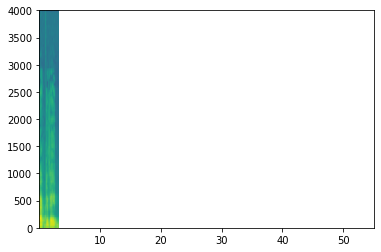

In [153]:
path="./Paper data/ENC/test_time/"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")

filenum=os.listdir(path)
while index<=len(filenum):
    filenames=glob.glob(os.path.join(path, '*.wav'))
    whitenoise1=AudioSegment.from_wav(filenames[index])
    noise,rate=librosa.load(filenames[index])
    end=len(sound)
    wnlen=len(whitenoise1)
    nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
    start=nonsil[0]
    nonsilstart=start[0]
    total=10001-end
    trailsil = AudioSegment.silent(duration=total)
    final=sound+trailsil
    i=80
    pos=80
    #c=0
    #end=len(sound)
    print("{}".format(os.path.basename(filenames[index]).split(".")[0]))


    while i<=end and pos<=end:
        sound1=sound[i:i+wnlen]
        sou1=sound1.export("chunk1.wav",format="wav")
        s1, rate = librosa.load("./chunk1.wav")
        amp=np.mean(s1**2)
        es=len(sound1)*amp
        noise,rate=librosa.load(filenames[index])        
        en=len(whitenoise1)*np.mean(noise**2)
        #print("energy of Activate of the chunk {}-{} is".format(i,i+2),es,"Energy of noise",en)
        const=es/en
        combined = final.overlay(whitenoise1,position=i)
        triggername  = combined.export("EN.wav",format="wav")
        prediction = detect_triggerword(triggername)
        chime_on_activate(triggername, prediction, 0.5)
        probablity=max(prediction[0,:,0])
        print("initial pos",pos,probablity,"energy",en)
        if probablity<0.5:
            print(pos,"A",en,es)
        else:
            while probablity>0.5 and en<=1000000000000000000000000000000*es: 
                noise=noise*math.sqrt(const)
                sf.write("./Paper data/ENC/constener.wav",noise,22050)
                white_noise=AudioSegment.from_wav("./Paper data/ENC/constener.wav")

                overlaying = final.overlay(white_noise,position=i)
                detect  = overlaying.export("overlaidenc.wav",format="wav")
                predicts= detect_triggerword(detect)
                chime_on_activate(detect, predicts, 0.5)
                probablity=max(predicts[0,:,0])
                en=len(white_noise)*np.mean(noise**2)
                print("pos",pos,"probablity",probablity,en)
                #print(colored("New energy {} scaling {}".format(np.mean(noise**2),const),"red",attrs=['bold']))
                const=const*1.25
                if probablity<0.5 and en<=1000000000000000000000000000000*es:
                    print(pos,"A",en,es)
            else:
                print(colored("{} NA {} {}".format(pos,en,es),"red",attrs=['bold']))



        #print(colored("energy required to interrupt wake word detection at pos {} is {}::energy at pos {} is {}".format(pos,en,pos,es),"green",attrs=['bold']))
        i+=2
        pos+=2
    index+=1

In [22]:
path="./Paper data/ENC/TIME"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")

filenum=os.listdir(path)
while index<=len(filenum):
    filenames=glob.glob(os.path.join(path, '*.wav'))
    whitenoisenc=AudioSegment.from_wav(filenames[index])
    noisenc,rate=librosa.load(filenames[index])
    end=len(sound)
    wnlen=len(whitenoisenc)
    #print(wnlen)
    nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
    start=nonsil[0]
    nonsilstart=start[0]
    total=10001-end
    trailsil = AudioSegment.silent(duration=total)
    final=sound+trailsil
    i=start[0]
    pos=0
    print("{}".format(os.path.basename(filenames[index]).split(".")[0]))
    while i<=end and pos<=end:
        sound1=sound[i:i+wnlen]
        sou1=sound1.export("chunkwnc.wav",format="wav")
        s1, rate = librosa.load("./chunkwnc.wav")
        amp=np.mean(s1**2)
        es=len(sound1)*amp
        noisenc,rate=librosa.load(filenames[index])
        en=wnlen*np.mean(noisenc**2)
        #print("len of activate chunk is",len(sound1))
        #print("energy of Activate of the chunk {}-{} is".format(i,i+2),es,"Energy of noise",en)
        const=es/en
        combined = final.overlay(whitenoisenc,position=i)
        triggername  = combined.export("Encwn.wav",format="wav")
        prediction = detect_triggerword(triggername)
        chime_on_activate(triggername, prediction, 0.5)
        probablity=max(prediction[0,:,0])
        #print("initial pos",pos,probablity,"Initial Energy",en)
        if probablity<0.5:
            print(pos,"A",en,es,len(whitenoisenc))
        else:
            while probablity>0.5 and en<=500*es:
                #print("energy then",en)
                noisenc=noisenc*5*math.sqrt(const)
                sf.write("./Paper data/ENC/enconstener{} pos{}.wav".format(en,pos),noisenc,22050)
                white_noise=AudioSegment.from_wav("./Paper data/ENC/enconstener{} pos{}.wav".format(en,pos))

                overlaying = final.overlay(white_noise,position=i)
                detect  = overlaying.export("overlaidenc.wav",format="wav")
                predicts = detect_triggerword(detect)
                chime_on_activate(detect, predicts, 0.5)
                probablity=max(predicts[0,:,0])
                en=len(white_noise)*np.mean(noisenc**2)
                #print("pos",pos,"probablity",probablity,"energy",en)
                #print(colored("New energy {} scaling {}".format(np.mean(noise1**2),const),"red",attrs=['bold']))
                const=const*2
                if probablity<0.5:
                    print(pos,"A",en,es,len(white_noise))
                elif probablity>0.5 and en>500*es:
                    print(pos,"NA",0,es,len(white_noise))
        i+=2
        pos+=2
    index+=1
   
        #print(colored("energy required to interrupt wake word detection at pos {} is {}::energy at pos {} is {}".format(pos,en,pos,es),"green",attrs=['bold']))


WN SNR0 0-4000 time 128


C:\Users\Prathyusha\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
C:\Users\Prathyusha\AppData\Roaming\Python\Python36\site-packages\keras\engine\training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


0 A 86.77519989013672 3.471008062362671 128
2 A 86.09501647949219 3.443800687789917 128
4 A 85.87078094482422 3.434830904006958 128
6 A 85.4305648803711 3.417222499847412 128
8 A 84.91703796386719 3.396681547164917 128
10 A 83.6305923461914 3.3452234268188477 128
12 A 82.95355987548828 3.3181421756744385 128
14 A 81.67756652832031 3.2671022415161133 128
16 A 80.43965911865234 3.217586040496826 128
18 A 78.2271957397461 3.129087448120117 128
20 A 32458.86328125 3.1061458587646484 128
22 A 72.65702819824219 2.906280755996704 128
24 A 71.3528060913086 2.854111909866333 128
26 A 23945.173828125 2.6678667068481445 128
28 NA 0 2.6003897190093994 128
30 NA 0 2.4967586994171143 128
32 NA 0 2.3706867694854736 128
34 NA 0 2.357957601547241 128
36 NA 0 2.161039352416992 128
38 NA 0 2.1206934452056885 128
40 NA 0 1.9094390869140625 128
42 NA 0 1.8593344688415527 128
44 NA 0 1.708089828491211 128
46 NA 0 1.6007130146026611 128
48 A 7750.486328125 1.517817735671997 128
50 NA 0 1.3701649904251099 128

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001668A277BF8> (for post_execute):


KeyboardInterrupt: 

In [ ]:
~sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")
whitenoise01=AudioSegment.from_wav("./Paper data/ECC/Energy/WN SNR0 BW 0-8000 window length 256.0.wav")
noise,rate=librosa.load("./Paper data/ECC/Energy/WN SNR0 BW 0-8000 window length 256.0.wav")
end=len(sound)
wnlen=len(whitenoise01)
nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
start=nonsil[0]
nonsilstart=start[0]
total=10001-end
trailsil = AudioSegment.silent(duration=total)
final=sound+trailsil
i=400
pos=400
#c=0
#end=len(sound)


while i<=430and pos<=430:
    sound1=sound[i:i+2]
    sou1=sound1.export("chunk1.wav",format="wav")
    s1, rate = librosa.load("./chunk1.wav")
    amp=np.mean(s1**2)
    es=len(sound1)*amp
    dur=2
    while dur<=256:
        wndur=whitenoise01[0:dur]
        
        wndur1=wndur.export("wndur.wav",format="wav")
        noise1,rate=librosa.load("./wndur.wav")
        en=len(wndur)*np.mean(noise1**2)

        #print("energy of Activate of the chunk {}-{} is".format(i,i+2),es,"Energy of noise",en)
        const=es/en
        combined = final.overlay(wndur,position=i)
        triggername  = combined.export("Ec.wav",format="wav")
        prediction = detect_triggerword(triggername)
        chime_on_activate(triggername, prediction, 0.5)
        probablity=max(prediction[0,:,0])
        #print("initial pos",pos,probablity)
        if probablity<0.5:
            print(pos,"A","Initial Energy was enough",en,"Signal energy",es,"effected length",len(wndur))
        while probablity>0.5 and en<=500*es: 
            noise1=noise1*5*math.sqrt(const)
            sf.write("./Paper data/ECC/constener.wav",noise,22050)
            white_noise=AudioSegment.from_wav("./Paper data/ECC/constener.wav")

            overlaying = final.overlay(white_noise,position=i)
            detect  = overlaying.export("overlaid.wav",format="wav")
            predicts = detect_triggerword(detect)
            chime_on_activate(detect, predicts, 0.5)
            probablity=max(predicts[0,:,0])
            en=len(white_noise)*np.mean(noise1**2)
            print("pos",pos,"probablity",probablity)
            #print(colored("New energy {} scaling {}".format(np.mean(noise**2),const),"red",attrs=['bold']))
            const=const*5
            if probablity<0.5 and en<=500*es:
                print(pos,"A","Energy Needed",en,"Energy of the Signal",es,"Duration",dur)
            while probablity>0.5 and en>=500*es and dur<=256:
                print(colored("{} Not worked {} {} duration {}".format(pos,en,es,dur),"red",attrs=['bold']))
                dur=dur*2
                wndur2=whitenoise01[0:dur]
                wndur3=wndur2.export("wndurm.wav",format="wav")
                noise2,rate=librosa.load("./wndurm.wav")
                en=len(wndur1)*np.mean(noise**2)
                const=es/en
                combined = final.overlay(wndur,position=i)
                triggername  = combined.export("Ec.wav",format="wav")
                prediction = detect_triggerword(triggername)
                chime_on_activate(triggername, prediction, 0.5)
                probablity=max(prediction[0,:,0])
    
    i+=2
    pos+=2
    #print(colored("energy required to interrupt wake word detection at pos {} is {}::energy at pos {} is {}".format(pos,en,pos,es),"green",attrs=['bold']))


In [ ]:
import gc
#path="./Paper data/ECC/Energy/WN SNR5 1000-2000 window length 2.0.wav"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")
whitenoise01=AudioSegment.from_wav("./Paper data/ECC/Energy/WN SNR-10 1000-2000 window length 2.0.wav")
w01, rate = librosa.load("./Paper data/ECC/Energy/WN SNR-10 1000-2000 window length 2.0.wav")
end=len(sound)
#print(end)
wnlen=len(whitenoise01)
nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
start=nonsil[0]
nonsilstart=start[0]
#print(nonsilstart)
total=10001-end
trailsil = AudioSegment.silent(duration=total)
final=sound+trailsil
#print("Total length",len(final))
#newwhite=w01
i=400
pos=400
predicts=[]
#energy=1
newwhiten=w01
while i<=410 and pos<=410: 
    scf=1.25
    combined = final.overlay(whitenoise01,position=i)
    triggername  = combined.export("Ec.wav",format="wav")
    prediction = detect_triggerword(triggername)
    chime_on_activate(triggername, prediction, 0.5)
    probablity=max(prediction[0,:,0])
    print("initial pos",pos,probablity)
    En=wnlen*(np.mean(newwhiten**2))
    print("Before energy",En)
    while probablity>0.5 and scf<1000:
        #w1, rate = librosa.load("./Paper data/ECC/testenergy/testwhite.wav")
        #ip.display(ip.Audio(data=w1, rate=rate))
        newwhiten=newwhiten*scf
        en2=len(newwhiten)*(np.mean(newwhiten**2))  
        sf.write("./Paper data/ECC/testenergy/testwhite.wav",newwhiten,22050)
        whitenoi1 = AudioSegment.from_wav("./Paper data/ECC/testenergy/testwhite.wav")
        combined1 = final.overlay(whitenoi1,position=i)
        triggername1  = combined1.export("testtrigger.wav",format="wav")
        predictions = detect_triggerword(triggername1)
        chime_on_activate(triggername1, prediction, 0.5)
        probablity=max(predictions[0,:,0])
        #ip.display(ip.Audio("./chime_output.wav"))
        print(colored("New energy {} scaling {}".format(en2,scf),"red",attrs=['bold']))
        print("pos",pos,"prob",probablity)
        scf=(scf)*2
    i=i+1.8
    pos=pos+2

initial pos 400 0.28498396
Before energy 1.2018135786056519
initial pos 402 0.520666
Before energy 1.2018135786056519
New energy 105.75959491729736 scaling 2
pos 402 prob 0.47107172
initial pos 404 0.7797404
Before energy 1.2018135786056519
New energy 105.75959491729736 scaling 2
pos 404 prob 0.7631666
New energy 1692.1535186767578 scaling 4
pos 404 prob 0.7152694
New energy 108297.8251953125 scaling 8
pos 404 prob 0.7243407
New energy 27724243.25 scaling 16
pos 404 prob 0.79151857
New energy 28389625088.0 scaling 32
pos 404 prob 0.79151857
New energy 116283904360448.0 scaling 64
pos 404 prob 0.79151857
New energy 1.90519548904158e+18 scaling 128
pos 404 prob 0.79151857
New energy 1.2485889156982899e+23 scaling 256
pos 404 prob 0.79151857
New energy 3.273100927168125e+28 scaling 512
pos 404 prob 0.79151857
initial pos 406 0.6665585
Before energy 1.2018135786056519
New energy 105.75959491729736 scaling 2
pos 406 prob 0.59136266
New energy 1692.1535186767578 scaling 4
pos 406 prob 0.5882

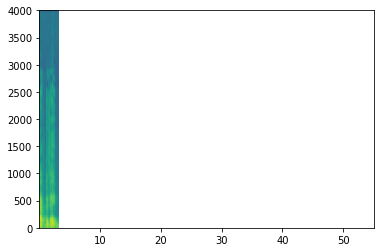

In [46]:
import gc
#path="./Paper data/ECC/Energy/WN SNR5 1000-2000 window length 2.0.wav"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")
whitenoise01=AudioSegment.from_wav("./Paper data/ECC/Energy/WN SNR-10 1000-2000 window length 2.0.wav")
w01, rate = librosa.load("./Paper data/ECC/Energy/WN SNR-10 1000-2000 window length 2.0.wav")
end=len(sound)
#print(end)
wnlen=len(whitenoise01)
nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
start=nonsil[0]
nonsilstart=start[0]
#print(nonsilstart)
total=10001-end
trailsil = AudioSegment.silent(duration=total)
final=sound+trailsil
#print("Total length",len(final))
#newwhite=w01
i=400
pos=400
predicts=[]
#energy=1

while i<=410 and pos<=410:
    newwhiten=w01
    scf=1.25
    combined = final.overlay(whitenoise01,position=i)
    triggername  = combined.export("Ec.wav",format="wav")
    prediction = detect_triggerword(triggername)
    chime_on_activate(triggername, prediction, 0.5)
    probablity=max(prediction[0,:,0])
    print("initial pos",pos,probablity)
    En=wnlen*(np.mean(newwhiten**2))
    print("Before energy",En)
    while probablity>0.5 and scf<1000:
        #w1, rate = librosa.load("./Paper data/ECC/testenergy/testwhite.wav")
        #ip.display(ip.Audio(data=w1, rate=rate))
        newwhiten=newwhiten*scf
        en2=len(newwhiten)*(np.mean(newwhiten**2))  
        sf.write("./Paper data/ECC/testenergy/testwhite.wav",newwhiten,22050)
        whitenoi1 = AudioSegment.from_wav("./Paper data/ECC/testenergy/testwhite.wav")
        combined1 = final.overlay(whitenoi1,position=i)
        triggername1  = combined1.export("testtrigger.wav",format="wav")
        predictions = detect_triggerword(triggername1)
        chime_on_activate(triggername1, prediction, 0.5)
        probablity=max(predictions[0,:,0])
        #ip.display(ip.Audio("./chime_output.wav"))
        print(colored("New energy {} scaling {}".format(en2,scf),"red",attrs=['bold']))
        print("pos",pos,"prob",probablity)
        scf=(scf)*2
    i=i+1.8
    pos=pos+2

In [ ]:
import gc
count=[]
#path="./Paper data/ECC/Energy/WN SNR5 1000-2000 window length 2.0.wav"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")

whitenoise1=AudioSegment.from_wav("./Paper data/ECC/Energy/WN SNR5 1000-2000 window length 2.0.wav")
            #ip.display(ip.Audio("./Simulation1/Energy/WN SNR{} BW {} from{} to{} time {} Energy{}.wav".format(snr[s],Bw[b],lowcut,highcut,t,E2)))

    
w1, rate = librosa.load("./Paper data/ECC/Energy/WN SNR5 1000-2000 window length 2.0.wav")
amp=np.mean(w1**2)
#energy=len(whitenoise1)*amplitud
#print("Energy",energy)
end=len(sound)
#print(end)
nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
start=nonsil[0]
nonsilstart=start[0]
#print(nonsilstart)
total=10001-end
trailsil = AudioSegment.silent(duration=total)
final=sound+trailsil
#print("Total length",len(final))

i=start[0]
pos=0
predicts=[]
#print("{}".format(os.path.basename(filenames[index]).split(".")[0]))
while i<=4 and pos<=4:
    combined = final.overlay(whitenoise1,position=i)
    triggername  = combined.export("Ecctest.wav",format="wav")
    prediction = detect_triggerword(triggername)
    chime_on_activate(triggername, prediction, 0.5)
    probablity=max(prediction[0,:,0])
    preds=prediction[0,:,0] 
    print(pos,probablity)
    if probablity>=0.5:
        energy=(len(whitenoise1))*(amp)
        newnoise1=w1*energy
        sf.write("./Paper data/ECC/testenergy/newnoise.wav",newnoise1,22050)
        whitenoise1=AudioSegment.from_wav("./Paper data/ECC/testenergy/newnoise.wav")
        w1, rate = librosa.load("./Paper data/ECC/testenergy/newnoise.wav")
        print(np.mean(w1**2))
        
        combined = final.overlay(whitenoise1,position=i)
        triggername  = combined.export("Ecctest.wav",format="wav")
        prediction = detect_triggerword(triggername)
        chime_on_activate(triggername, prediction, 0.5)
        probablity=max(prediction[0,:,0])
        preds=prediction[0,:,0] 
        amp=2*(amp)

        #print("energy",energy,"ampli",amp,"amplitude of w1",np.mean(w1**2),"amplitude of newnoise",np.mean(newnoise1**2))

i=i+1.8
pos=pos+2

## Test

C:\Users\Prathyusha\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\axes\_axes.py:7626: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
C:\Users\Prathyusha\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\engine\training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


max 0.9935822
0.07017966
0.06168315
0.057150394
0.05412673
0.051953807
0.050274666
0.04879597
0.04751861
0.04619337
0.0448116
0.040368095
0.03562332
0.03379832
0.031927664
0.02920371
0.0264561
0.024193274
0.022482798
0.021136107
0.019830223
0.018737398
0.017883645
0.017263588
0.016824253
0.016578611
0.016354972
0.015714252
0.014846316
0.012761218
0.011548293
0.010901695
0.010529205
0.010231773
0.009981995
0.010360341
0.011243718
0.012108557
0.015060931
0.02002854
0.025038648
0.029287467
0.032722544
0.0351548
0.025690215
0.02265554
0.021409836
0.020804377
0.020441841
0.020091016
0.01976882
0.01939117
0.018983368
0.018416274
0.01784608
0.017096028
0.016484898
0.01579389
0.0151529005
0.014466549
0.013822833
0.013118111
0.013392697
0.016157534
0.019295556
0.021729603
0.023761554
0.024743853
0.024770055
0.024236767
0.02302141
0.022829065
0.02408288
0.023766506
0.02264024
0.022173168
0.022458619
0.024036622
0.027241783
0.032382164
0.03542742
0.037896547
0.041796647
0.048574027
0.059276305
0.

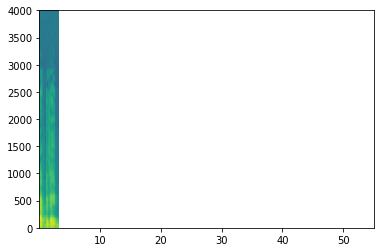

In [40]:
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")
end=len(sound)
#print(end)
nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
start=nonsil[0]
nonsilstart=start[0]
#print(nonsilstart)
total=10001-end
trailsil = AudioSegment.silent(duration=total)
final=sound+trailsil
finale  = final.export("finale.wav",format="wav")

#chime_on_activate(sound, prediction, 0.5)
#IPython.display.Audio("./chime_output.wav")
predictions = detect_triggerword(finale)
predi=predictions[0,:,0]
print("max",max(predi))
for p in predi:
    print(p)

WN SNR-10 BW 0-8000 window length 128
freq [[6.46391403e+02 2.76558580e+03 4.67768967e+03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [9.68133463e+02 5.37200989e+03 5.91272451e+03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [1.12580676e+03 3.23696505e+03 2.34326172e+02 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [1.71635163e-04 8.88952162e-04 5.61594035e-04 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [3.51524861e-04 4.40429546e-04 1.74233329e-03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.63201968e-04 1.75269227e-05 2.80193910e-04 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]
259 0.040816404
0.040816404
0.018540602
0.010149307
0.0064733415
0.0043718987
0.0030335463
0.0021428983
0.001526492
0.0011131109
0.0008191742
0.0006035316
0.00046510488
0.0003851905
0.00033915025
0.00031137277
0.00029405722
0.00028334823
0.0002772567
0.00027467482
0.00027452532
0.0002767135
0.00028127438
0.00028820636
0.00029752924
0.00030966816
0.0003247

IndexError: list index out of range

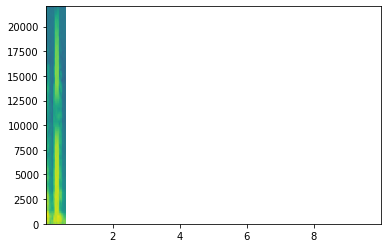

In [42]:
import gc
count=[]
path="./Paper data/ECC/E-Test"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/1_act2.wav")
filenum=os.listdir(path)
while index<=len(filenum):
    filenames=glob.glob(os.path.join(path, '*.wav'))
    whitenoise1=AudioSegment.from_wav(filenames[index])
                #ip.display(ip.Audio("./Simulation1/Energy/WN SNR{} BW {} from{} to{} time {} Energy{}.wav".format(snr[s],Bw[b],lowcut,highcut,t,E2)))
    end=len(sound)
    #print(end)
    nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
    start=nonsil[0]
    nonsilstart=start[0]
    #print(nonsilstart)
    total=10001-end
    trailsil = AudioSegment.silent(duration=total)
    final=sound+trailsil
    #print("Total length",len(final))
    
    i=259
    pos=259
    predicts=[]
    print("{}".format(os.path.basename(filenames[index]).split(".")[0]))
    while i<=259 and pos<=259:
        combined = final.overlay(whitenoise1,position=i)
        
        #print(len(teste))
       
        #print(len(testfinal))
        
        triggername  = combined.export("combined1.wav",format="wav")
        prediction = detect_triggerword(triggername)
        chime_on_activate(triggername, prediction, 0.5)
        probablity=max(prediction[0,:,0])
        preds=prediction[0,:,0]
        #print("MAX",probablity)
        #print('Positions',pos,'Max',probablity)
        #df=pd.DataFrame(newlist)
        #print(prob.dtype)
        #strt=strt+1
        #pos=pos+1
        print(pos,probablity)
        for p in preds:
            print(p)
                #             if p>0.5:
           # predicts.append(p)
        #l=len(predicts)      
        #print(pos,l)
        count.append({'position':pos,'count':p})
        df=pd.DataFrame(count)
        i=i+1
        pos=pos+1
        index+=1
    #df.to_csv('./Paper data/ECC/test/test{}.csv'.format(i),index = False)
    #del[df]
            
    count.clear()
        
        #predicts.clear()
    


## SAme energies and frequencies

WN SNR-10 2000-3000 window length 128


0 0


3 0


6 0


9 0


KeyboardInterrupt: 

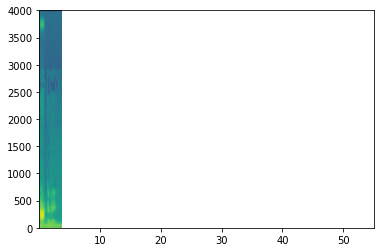

In [65]:
import gc
count=[]
path="./Paper data/ECC/EN/"
index=0
sound = AudioSegment.from_wav("./raw_data/activates/2_act2.wav")
filenum=os.listdir(path)
while index<=len(filenum):
    filenames=glob.glob(os.path.join(path, '*.wav'))
    whitenoise1=AudioSegment.from_wav(filenames[index])
                #ip.display(ip.Audio("./Simulation1/Energy/WN SNR{} BW {} from{} to{} time {} Energy{}.wav".format(snr[s],Bw[b],lowcut,highcut,t,E2)))
    end=len(sound)
    #print(end)
    nonsil=silence.detect_nonsilent(sound,min_silence_len=1,silence_thresh=-25,seek_step=1)
    start=nonsil[0]
    nonsilstart=start[0]
    #print(nonsilstart)
    total=10001-end
    trailsil = AudioSegment.silent(duration=total)
    final=sound+trailsil
    #print("Total length",len(final))
    
    i=start[0]
    pos=0
    predicts=[]
    print("{}".format(os.path.basename(filenames[index]).split(".")[0]))
    while i<end and pos<end:
        combined = final.overlay(whitenoise1,position=i)
        triggername  = combined.export("Eccwn.wav",format="wav")
        prediction = detect_triggerword(triggername)
        chime_on_activate(triggername, prediction, 0.5)
        ip.display(ip.Audio("./chime_output.wav"))
        probablity=max(prediction[0,:,0])
        preds=prediction[0,:,0]
        #print("MAX",probablity)
        #print('Positions',pos,'Max',probablity)
        #df=pd.DataFrame(newlist)
        #print(prob.dtype)
        #strt=strt+1
        #pos=pos+1
        for p in preds:
            if p>0.5:
                #print(pos,p)
                predicts.append(p)
        l=len(predicts)      
        print(pos,l)
        count.append({'position':pos,'count':l})
        df=pd.DataFrame(count)
        
        predicts.clear()
        i=i+3
        pos=pos+3
    
    df.to_csv('./Paper data/ECC/ECC 256 cut/{}.0.csv'.format(os.path.basename(filenames[index]).split(".")[0]),index = False)
    del[df]
    print("Writing completed")
    count.clear()
    index+=1